In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import sparse
from sklearn.metrics.pairwise import pairwise_distances

In [2]:
df = pd.read_csv('data/nba_2eda.csv', index_col = [0])
df.columns

Index(['Player', 'Age', 'W', 'L', 'MP', 'FGM', 'FGA', 'FG%', '3PM', '3PA',
       '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'TOV', 'PF',
       'FP', 'DD2', 'TD3', '+/-', 'DEF_RTG', 'DREB%', 'T_DREB%', 'STL',
       'T_STL%', 'BLK', 'T_BLK%', 'OP_TOV', 'OP_2NDPTS', 'OP_PAINT', 'DEF_WS',
       'USG%', 'T_FGM%', 'T_FGA%', 'T_3PM%', 'T_3PA%', 'T_FTM%', 'T_FTA%',
       'T_OREB%', 'T_REB%', 'T_AST%', 'T_TOV%', 'T_BLKA%', 'T_PF%', 'T_PFD%',
       'T_PTS%', 'FGA_2P%', 'FGA_3P%', '2PT%', '2PT_MR%', '3PT%', 'FBPTS%',
       'OFFTOV%', 'PAINTPTS%', 'AST_2FGM%', 'UAST_2FGM%', 'AST_3FGM%',
       'UAST_3FGM%', 'FGM_AST%', 'FGM_UAST%', 'PTS_TOV', '2ND_CH_PTS',
       'FB_PTS', 'PAINT_PTS', 'OPP_PTS_TOV', 'OPP_2ND_PTS', 'OPP_FBPTS',
       'OPP_PAINT_PTS', 'BLKA', 'PFD', 'Minutes', 'BSR Off.', 'BSR Def.',
       'BSR Total', 'OOR Off.', 'OOR Def.', 'OOR Total', 'OVR Off.',
       'OVR Def.', 'OVR total', 'WAR', 'salary', 'off_kmean', 'def_kmean',
       'ov_kmean', 'shoot_kmean'],

## Sorting Features into categories

In [3]:
offensive = ['FG%', '3P%', 'OREB', 'TOV', 'DD2', 'FT%', ''
            'TD3', 'T_FGM%', 'T_FGA%', 'T_3PM%', 'T_3PA%', 'T_OREB%',
            'T_TOV%', 'T_STL%', '2ND_CH_PTS', 'FB_PTS', 'BSR Off.',
            'OOR Off.', 'OVR Off.', 'WAR', 'FP', 'off_kmean']

defensive = ['DREB', 'DEF_RTG', 'DREB%', 'T_DREB%', 'STL', 'T_STL%',
            'BLK', 'DEF_WS', 'T_DREB%', 'T_BLK%', 'T_BLKA%',
            'BLKA', 'BSR Def.', 'OVR Def.', 'OVR Def.', 'WAR', 'FP', 'def_kmean']

overall = ['REB','AST', 'FP', 'DD2', 'TD3', 'USG%', 'T_REB%',
          'T_AST%', 'PTS_TOV', 'BSR Total', 'OOR Total',
          'OVR total', 'WAR', 'ov_kmean']

shooting = ['FGA_2P%', 'FGA_3P%', '2PT%', '2PT_MR%', '3P%',
           'FBPTS%', 'OFFTOV%', 'PAINTPTS%', 'AST_2FGM%', 'UAST_2FGM%',
           'AST_3FGM%', 'UAST_3FGM%', 'FGM_AST%', 'FGM_UAST%'
           'shoot_kmean']

# Pairplots for life

C:\Users\Brianna Lytle\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Brianna Lytle\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


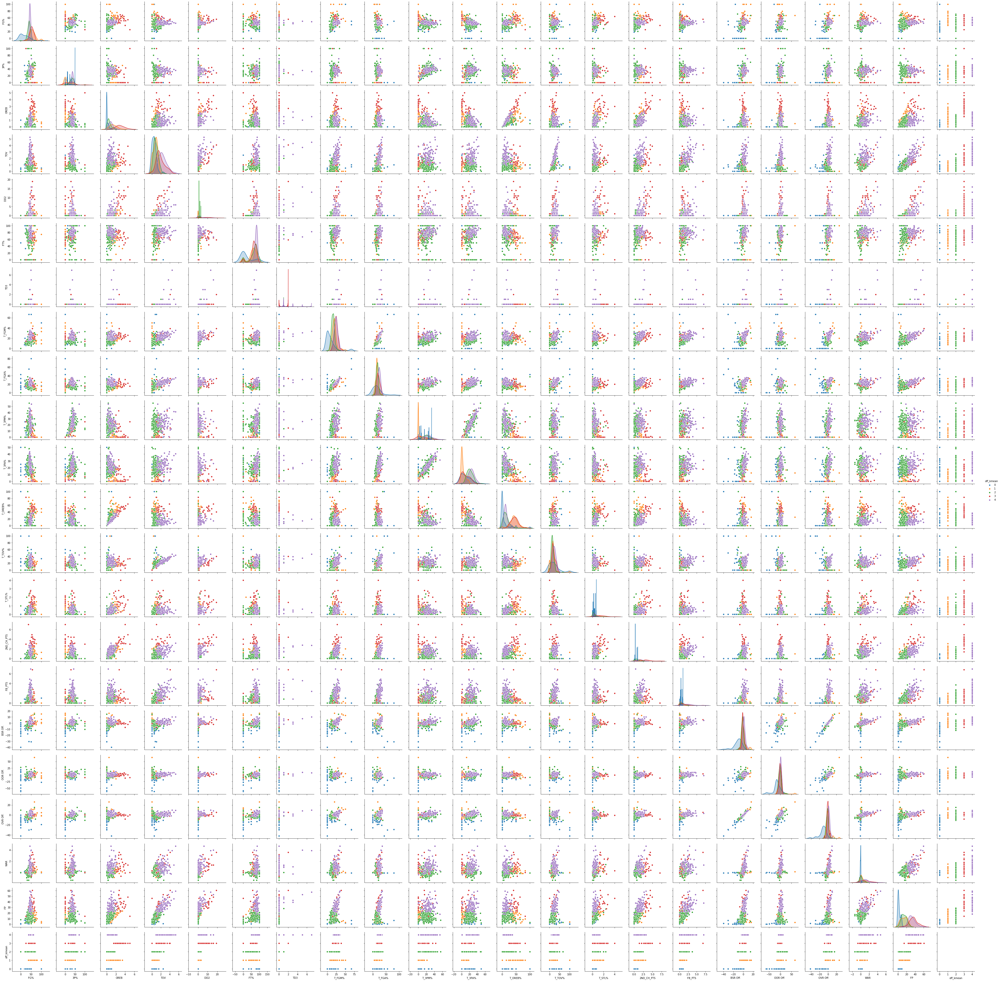

In [4]:
sns.pairplot(df[offensive], hue = 'off_kmean')

In [6]:
# sns.pairplot(df[defensive], hue = 'def_kmean')

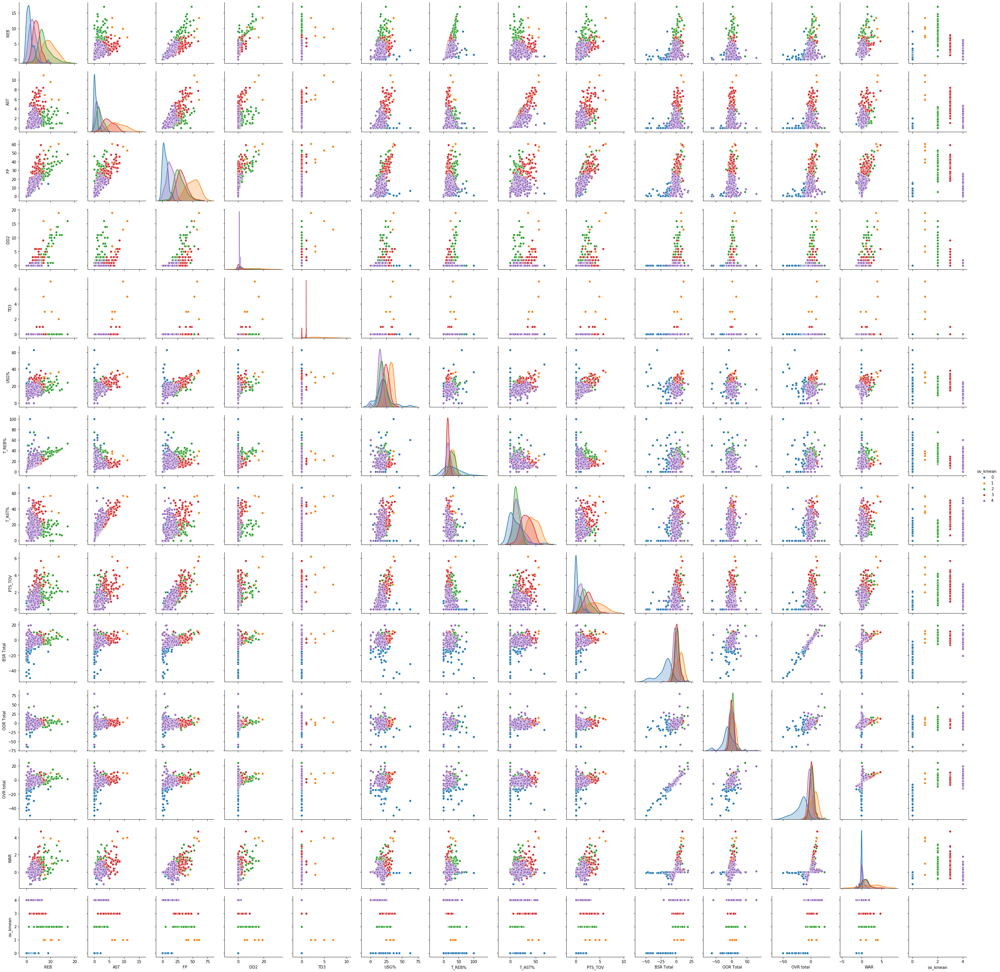

In [7]:
sns.pairplot(df[overall], hue = 'ov_kmean')

In [9]:
# sns.pairplot(df[shooting], hue = 'shoot_kmean')

## Offensive EDA

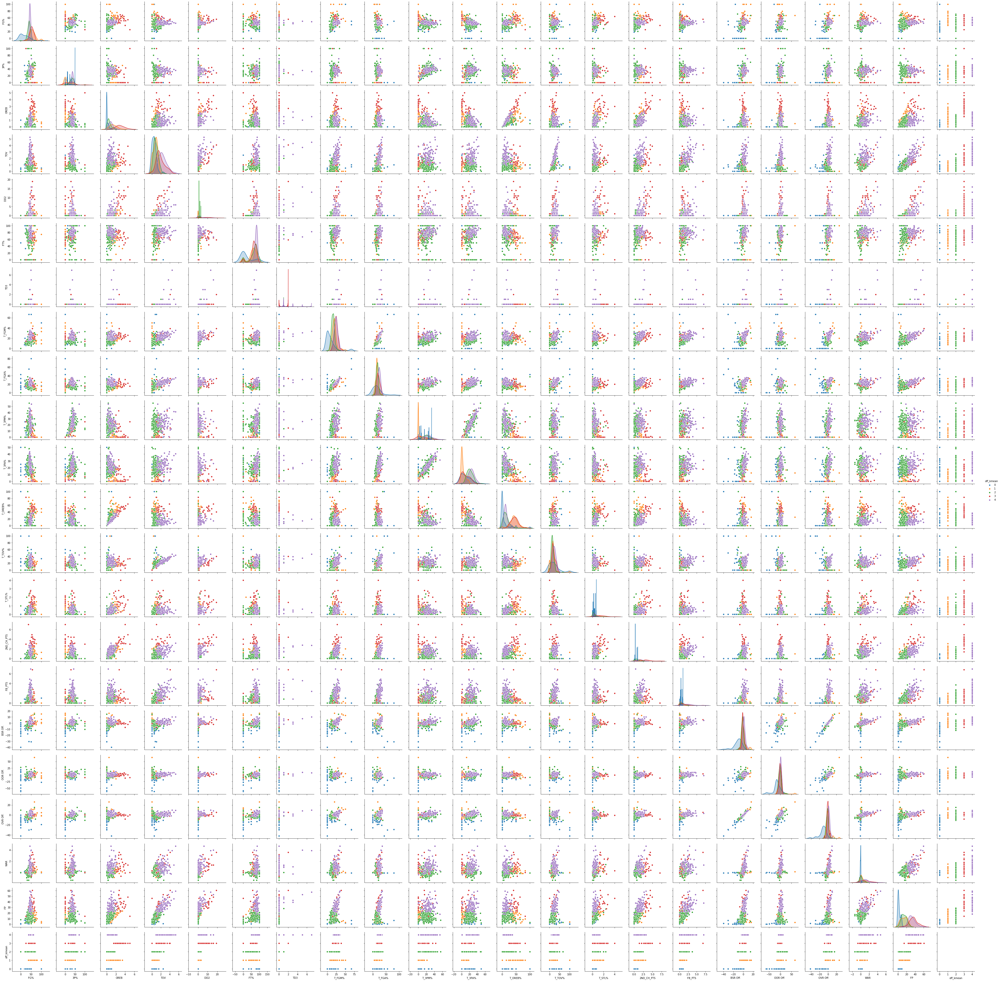

In [10]:
sns.pairplot(df[offensive], hue = 'off_kmean')

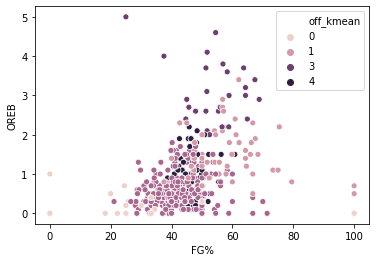

In [11]:
sns.scatterplot(x="FG%", y="OREB",
                    hue="off_kmean", data=df)

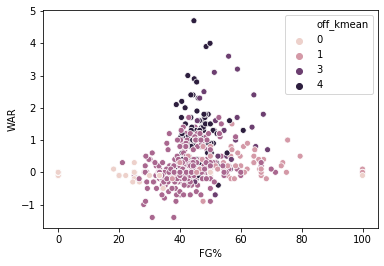

In [12]:
sns.scatterplot(x="FG%", y="WAR",
                    hue="off_kmean", data=df)

## Overall EDA

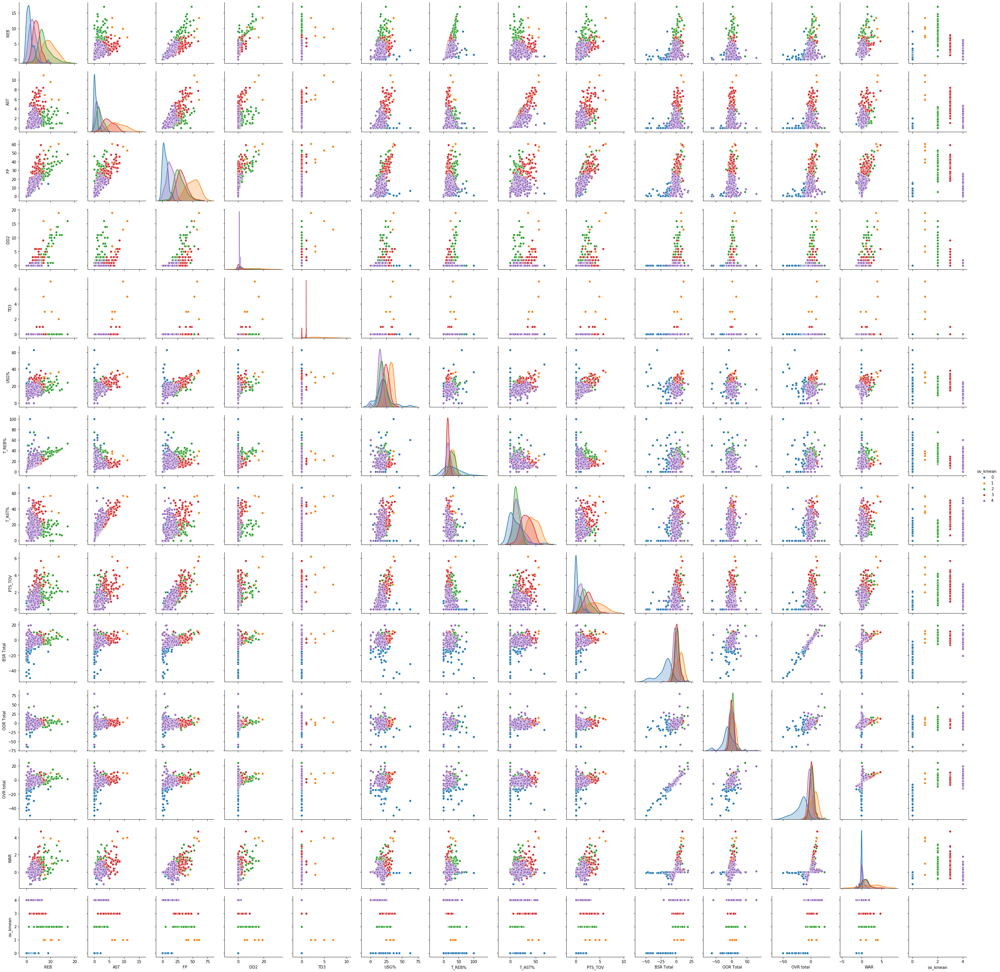

In [13]:
sns.pairplot(df[overall], hue = 'ov_kmean')

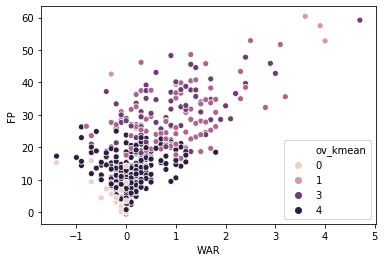

In [14]:
sns.scatterplot(x="WAR", y="FP",
                      hue="ov_kmean", data=df)

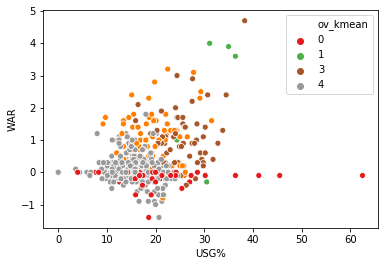

In [15]:
sns.scatterplot(x="USG%", y="WAR",
                      hue="ov_kmean", data=df, palette="Set1")